## Exploratory Data Analysis

In [1]:
import pandas as pd
import re
import nltk
import pickle

## 1. Load Data

In [2]:
data = pd.read_csv('data/desc_data.csv')

In [3]:
data.columns.tolist()

['Gender ',
 'Age',
 'Title',
 'School Type Level',
 'What is the School location',
 'School Category',
 'State']

## 2. Load Vectors

In [4]:
radio_school_neg = pd.read_csv('data/tokens/radio_school_neg.csv', index_col='Unnamed: 0')

In [5]:
radio_school_pos = pd.read_csv('data/tokens/radio_school_pos.csv', index_col='Unnamed: 0')

In [6]:
safety_school_concerns = pd.read_csv('data/tokens/safety_school_concerns.csv', index_col='Unnamed: 0')

In [7]:
safety_school_neg = pd.read_csv('data/tokens/safety_school_neg.csv', index_col='Unnamed: 0')

In [8]:
safety_school_pos = pd.read_csv('data/tokens/safety_school_pos.csv', index_col='Unnamed: 0')

In [9]:
schoolwork_less = pd.read_csv('data/tokens/schoolwork_less.csv', index_col='Unnamed: 0')

In [10]:
schoolwork_more = pd.read_csv('data/tokens/schoolwork_more.csv', index_col='Unnamed: 0')

In [11]:
learning_mat_less = pd.read_csv('data/tokens/learning_mat_less.csv', index_col='Unnamed: 0')

In [12]:
learning_mat_more = pd.read_csv('data/tokens/learning_mat_more.csv', index_col='Unnamed: 0')

## 3. Data VS Vectors

In [13]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

### 3.7.a. When schools re-open, do you think your school will have measures in place to ensure a safe learning environment? Why or why not?

In [154]:
lista = [safety_school_pos, safety_school_neg]
title = ['Why?','Why not?']

In [155]:
plt.rcParams['figure.figsize'] = [20 , 35]

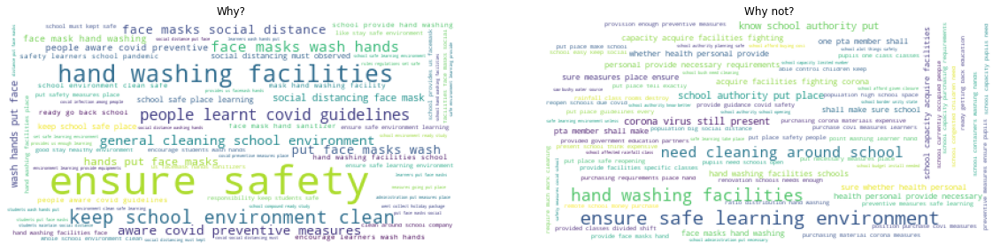

In [156]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
    
plt.show()

In [157]:
safety_school_pos.shape, safety_school_neg.shape

((2896, 3136), (1027, 534))

#### School Unsafe VS Gender

In [158]:
lista = [safety_school_neg[data.loc[safety_school_neg.index, 'Gender '] == 'Male'],
         safety_school_neg[data.loc[safety_school_neg.index, 'Gender '] == 'Female']]
title = ['Male','Female']

In [159]:
plt.rcParams['figure.figsize'] = [20 , 35]

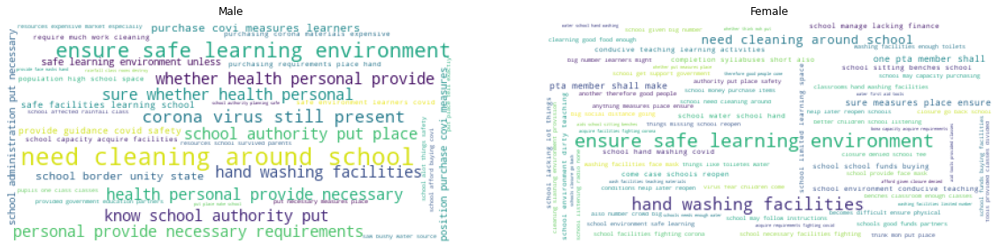

In [160]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
    
plt.show()

#### Schooll Unsafe VS Title

In [161]:
data.Title.value_counts()

Learner                    2510
Parent/guardian/sibling    1185
Teacher                     228
Name: Title, dtype: int64

In [162]:
safety_school_neg[data.loc[safety_school_neg.index, 'Title'] == 'Parent/guardian/sibling'].shape

(332, 534)

In [163]:
safety_school_neg[data.loc[safety_school_neg.index, 'Title'] == 'Learner'].shape

(652, 534)

In [164]:
safety_school_neg[data.loc[safety_school_neg.index, 'Title'] == 'Teacher'].shape

(43, 534)

In [165]:
lista = [safety_school_neg[data.loc[safety_school_neg.index, 'Title'] == 'Learner'], 
         safety_school_neg[data.loc[safety_school_neg.index, 'Title'] == 'Teacher']]
title = ['Learner','Teacher']

In [166]:
plt.rcParams['figure.figsize'] = [20 , 35]

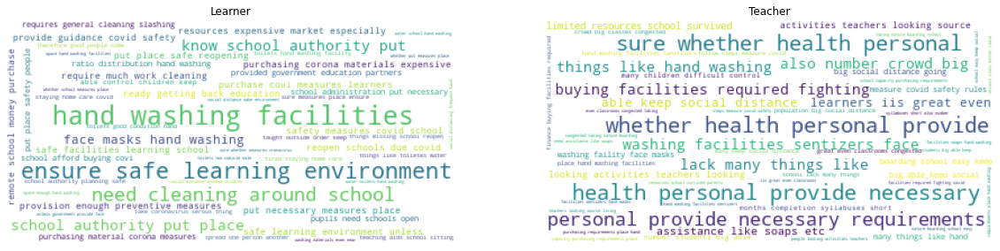

In [167]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
    
plt.show()

#### School Unsafe Reopen VS School Level

In [168]:
data.loc[:,'School Type Level'].value_counts()

Primary      3271
Secondary     612
ALP            34
ECD             4
AES             2
Name: School Type Level, dtype: int64

In [169]:
lista = [safety_school_neg[data.loc[safety_school_neg.index, 'School Type Level'] == 'Primary'],
         safety_school_neg[data.loc[safety_school_neg.index, 'School Type Level'] == 'Secondary']]
title = ['Primary','Secondary']

In [170]:
plt.rcParams['figure.figsize'] = [20 , 35]

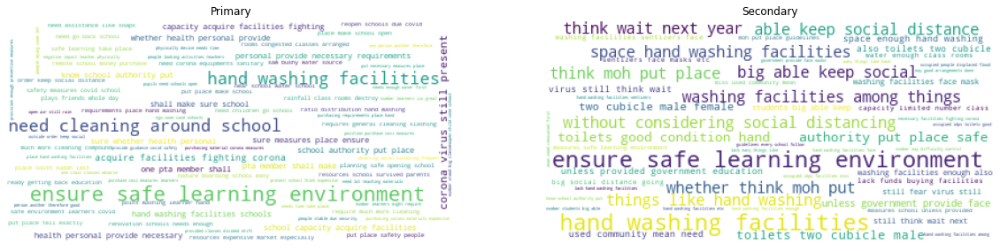

In [171]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
    
plt.show()

#### School Unsafe Reopen VS School Level

In [172]:
data.loc[:,'What is the School location'].value_counts()

Urban    2118
Rural    1805
Name: What is the School location, dtype: int64

In [173]:
lista = [safety_school_neg[data.loc[safety_school_neg.index, 'What is the School location'] == 'Urban'],
         safety_school_neg[data.loc[safety_school_neg.index, 'What is the School location'] == 'Rural']]
title = ['Urban','Rural']

In [174]:
plt.rcParams['figure.figsize'] = [20 , 35]

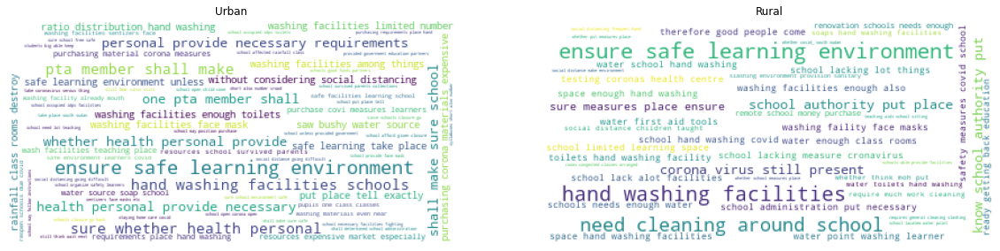

In [175]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
    
plt.show()

#### Schools Unsafe Reopen VS Age

In [176]:
data.loc[safety_school_neg.index, 'Age'].value_counts()

15.0    97
14.0    71
13.0    71
16.0    64
18.0    59
        ..
59.0     1
54.0     1
64.0     1
53.0     1
79.0     1
Name: Age, Length: 64, dtype: int64

In [177]:
lista = [safety_school_neg[data.loc[safety_school_neg.index, 'Age'] <= 19],
         safety_school_neg[data.loc[safety_school_neg.index, 'Age'] > 19]]
title = ['<= 19','> 19']

In [178]:
plt.rcParams['figure.figsize'] = [20 , 35]

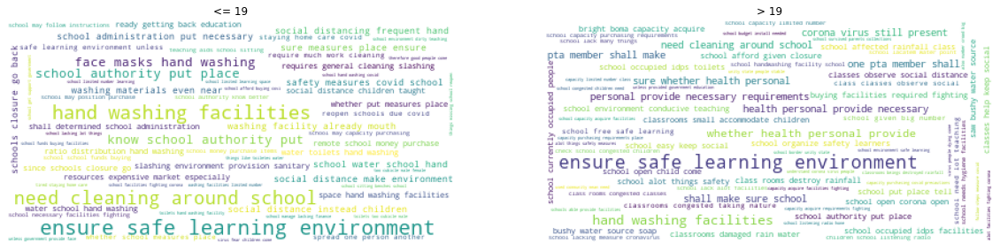

In [179]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
    
plt.show()

### 3.7.b. What are your concerns about returning to school?

In [180]:
plt.rcParams['figure.figsize'] = [10 , 25]

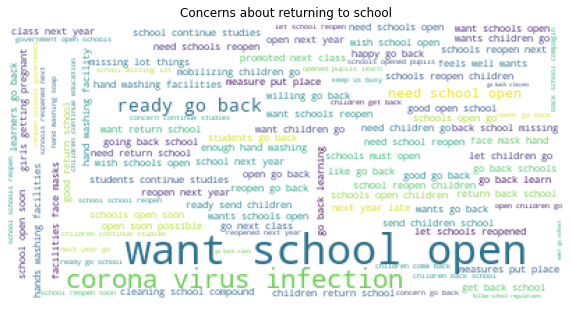

In [181]:
cloud = WordCloud(background_color='white')
cloud.generate_from_frequencies(safety_school_concerns.sum().sort_values())
plt.title('Concerns about returning to school')
plt.imshow(cloud)
plt.axis('off')
plt.show()

#### Concerns Returning to School VS Gender

In [182]:
lista = [safety_school_concerns[data.loc[safety_school_concerns.index, 'Gender '] == 'Male'],
         safety_school_concerns[data.loc[safety_school_concerns.index, 'Gender '] == 'Female']]
title = ['Male','Female']

In [183]:
plt.rcParams['figure.figsize'] = [20 , 35]

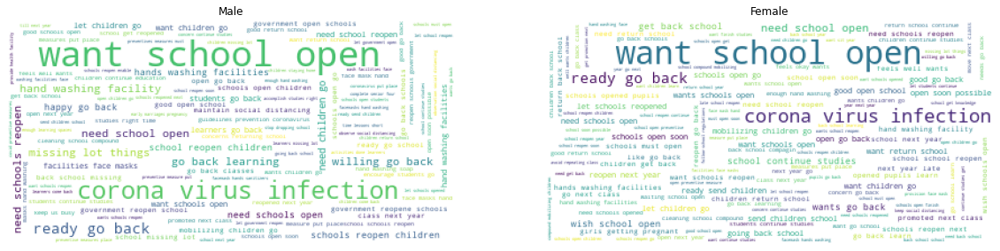

In [184]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
    
plt.show()

#### Concerns Returning to School VS Title

In [185]:
data.Title.value_counts()

Learner                    2510
Parent/guardian/sibling    1185
Teacher                     228
Name: Title, dtype: int64

In [186]:
safety_school_concerns[data.loc[safety_school_concerns.index, 'Title'] == 'Parent/guardian/sibling'].shape

(1185, 5430)

In [187]:
safety_school_concerns[data.loc[safety_school_concerns.index, 'Title'] == 'Learner'].shape

(2510, 5430)

In [188]:
safety_school_concerns[data.loc[safety_school_concerns.index, 'Title'] == 'Teacher'].shape

(228, 5430)

In [189]:
lista = [safety_school_concerns[data.loc[safety_school_concerns.index, 'Title'] == 'Learner'], 
         safety_school_concerns[data.loc[safety_school_concerns.index, 'Title'] == 'Teacher']]
title = ['Learner','Teacher']

In [190]:
plt.rcParams['figure.figsize'] = [20 , 35]

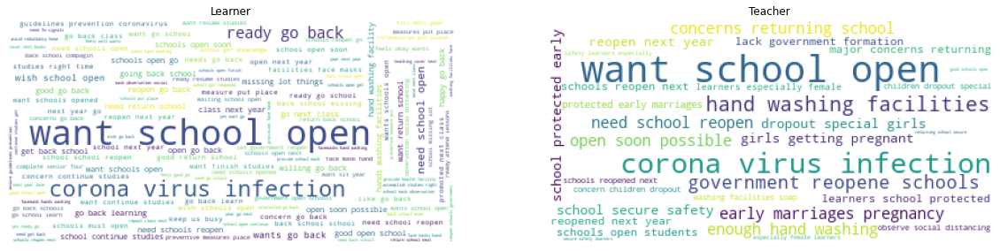

In [191]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
    
plt.show()

#### Concerns Returning to School VS School Level

In [192]:
data.loc[:,'School Type Level'].value_counts()

Primary      3271
Secondary     612
ALP            34
ECD             4
AES             2
Name: School Type Level, dtype: int64

In [193]:
lista = [safety_school_concerns[data.loc[safety_school_concerns.index, 'School Type Level'] == 'Primary'],
         safety_school_concerns[data.loc[safety_school_concerns.index, 'School Type Level'] == 'Secondary']]
title = ['Primary','Secondary']

In [194]:
plt.rcParams['figure.figsize'] = [20 , 35]

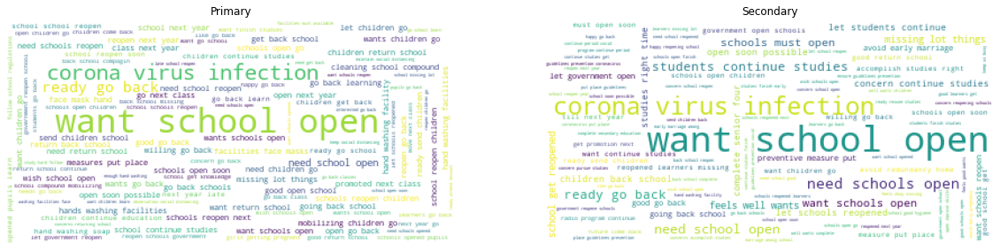

In [195]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
    
plt.show()

#### Concerns Returning to School VS School Level

In [196]:
data.loc[:,'What is the School location'].value_counts()

Urban    2118
Rural    1805
Name: What is the School location, dtype: int64

In [197]:
lista = [safety_school_concerns[data.loc[safety_school_concerns.index, 'What is the School location'] == 'Urban'],
         safety_school_concerns[data.loc[safety_school_concerns.index, 'What is the School location'] == 'Rural']]
title = ['Urban','Rural']

In [198]:
plt.rcParams['figure.figsize'] = [20 , 35]

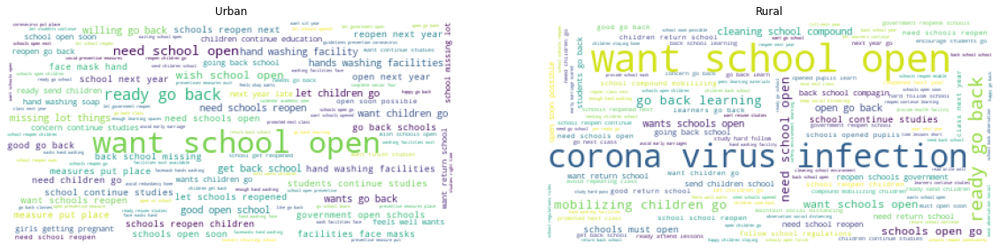

In [199]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
    
plt.show()

#### Concerns Returning to School VS Age

In [200]:
data.loc[safety_school_concerns.index, 'Age'].value_counts()

15.0    349
16.0    286
14.0    269
17.0    256
18.0    240
       ... 
75.0      2
80.0      2
62.0      1
79.0      1
73.0      1
Name: Age, Length: 69, dtype: int64

In [201]:
lista = [safety_school_concerns[data.loc[safety_school_concerns.index, 'Age'] <= 19],
         safety_school_concerns[data.loc[safety_school_concerns.index, 'Age'] > 19]]
title = ['<= 19','> 19']

In [202]:
plt.rcParams['figure.figsize'] = [20 , 35]

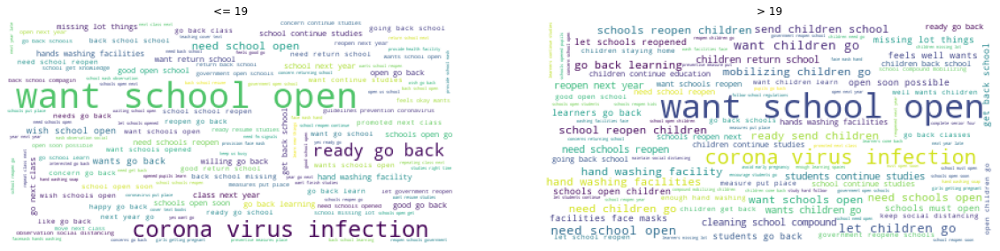

In [203]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
    
plt.show()

### 3.8. Are you/your learners doing more schoolwork or less schoolwork since the COVID-19 school closures? Why?

In [29]:
lista = [schoolwork_less, schoolwork_more]
title = ['Why less?','Why more?']

In [30]:
plt.rcParams['figure.figsize'] = [20 , 35]

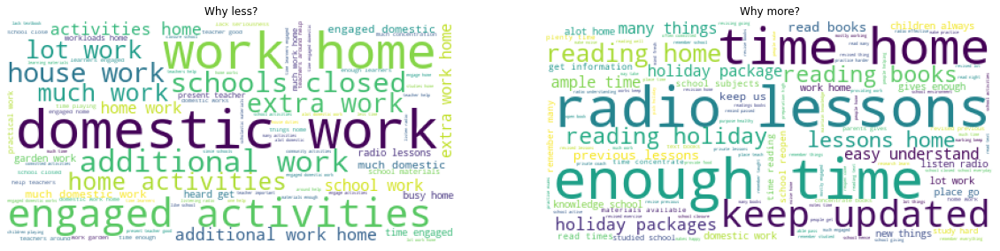

In [31]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
plt.savefig('data/imgs/clouds/schoolwork.jpeg',bbox_inches='tight', dpi=300)
plt.show()

In [207]:
schoolwork_less.shape, schoolwork_more.shape

((1159, 2820), (177, 338))

#### Less Schoolwork VS Gender

In [46]:
lista = [schoolwork_more[data.loc[schoolwork_more.index, 'Gender '] == 'Male'],
         schoolwork_more[data.loc[schoolwork_more.index, 'Gender '] == 'Female']]
title = ['Male','Female']

In [47]:
plt.rcParams['figure.figsize'] = [20 , 35]

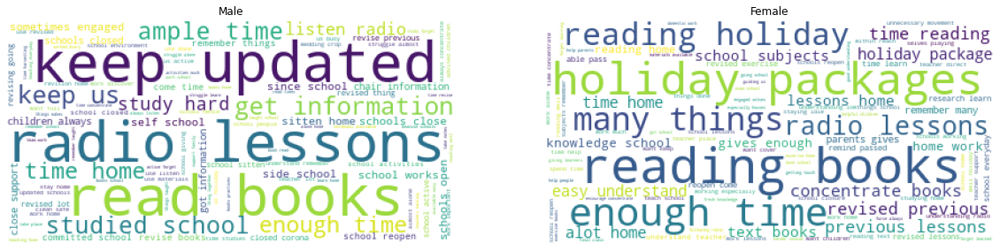

In [48]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
plt.savefig('data/imgs/clouds/schoolwork_more_gender.jpeg',bbox_inches='tight', dpi=300)
plt.show()

#### Less Schoolworkd VS Title

In [211]:
data.Title.value_counts()

Learner                    2510
Parent/guardian/sibling    1185
Teacher                     228
Name: Title, dtype: int64

In [212]:
schoolwork_less[data.loc[schoolwork_less.index, 'Title'] == 'Parent/guardian/sibling'].shape

(317, 2820)

In [213]:
schoolwork_less[data.loc[schoolwork_less.index, 'Title'] == 'Learner'].shape

(698, 2820)

In [214]:
schoolwork_less[data.loc[schoolwork_less.index, 'Title'] == 'Teacher'].shape

(144, 2820)

In [49]:
lista = [schoolwork_more[data.loc[schoolwork_more.index, 'Title'] == 'Learner'], 
         schoolwork_more[data.loc[schoolwork_more.index, 'Title'] == 'Teacher']]
title = ['Learner','Teacher']

In [50]:
plt.rcParams['figure.figsize'] = [20 , 35]

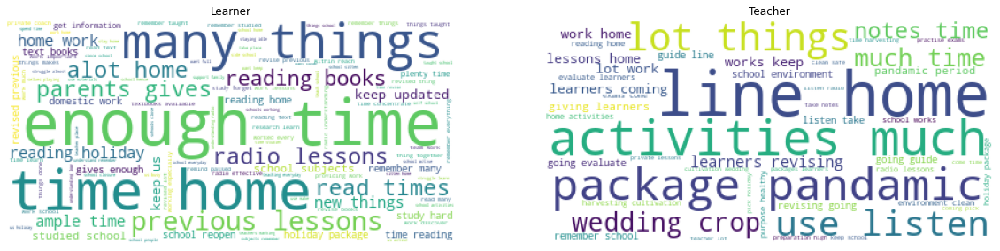

In [51]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
plt.savefig('data/imgs/clouds/schoolwork_more_title.jpeg',bbox_inches='tight', dpi=300)
plt.show()

#### Less Schoolwork VS School Level

In [218]:
data.loc[:,'School Type Level'].value_counts()

Primary      3271
Secondary     612
ALP            34
ECD             4
AES             2
Name: School Type Level, dtype: int64

In [52]:
lista = [schoolwork_more[data.loc[schoolwork_more.index, 'School Type Level'] == 'Primary'],
         schoolwork_more[data.loc[schoolwork_more.index, 'School Type Level'] == 'Secondary']]
title = ['Primary','Secondary']

In [53]:
plt.rcParams['figure.figsize'] = [20 , 35]

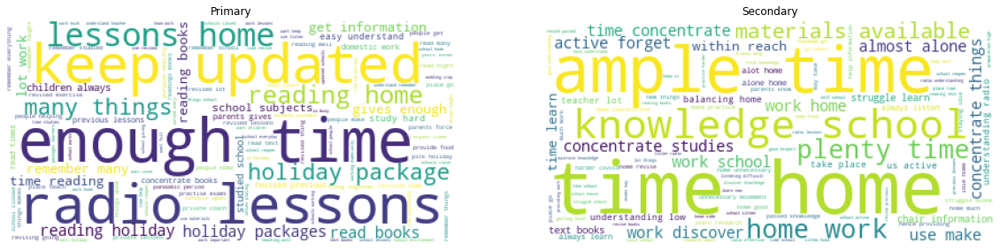

In [54]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
plt.savefig('data/imgs/clouds/schoolwork_more_level.jpeg',bbox_inches='tight', dpi=300)
plt.show()

#### Less Schoolwork VS School Level

In [222]:
data.loc[:,'What is the School location'].value_counts()

Urban    2118
Rural    1805
Name: What is the School location, dtype: int64

In [55]:
lista = [schoolwork_more[data.loc[schoolwork_more.index, 'What is the School location'] == 'Urban'],
         schoolwork_more[data.loc[schoolwork_more.index, 'What is the School location'] == 'Rural']]
title = ['Urban','Rural']

In [56]:
plt.rcParams['figure.figsize'] = [20 , 35]

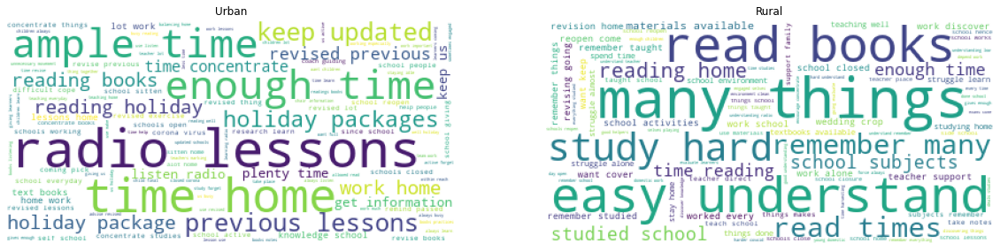

In [57]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
plt.savefig('data/imgs/clouds/schoolwork_more_location.jpeg',bbox_inches='tight', dpi=300)
plt.show()

#### Less Schoolwork VS Age

In [226]:
data.loc[schoolwork_less.index, 'Age'].value_counts()

15.0    92
18.0    80
16.0    79
17.0    78
14.0    67
        ..
61.0     1
8.0      1
64.0     1
7.0      1
65.0     1
Name: Age, Length: 61, dtype: int64

In [58]:
lista = [schoolwork_more[data.loc[schoolwork_more.index, 'Age'] <= 19], schoolwork_more[data.loc[schoolwork_more.index, 'Age'] > 19]]
title = ['<= 19','> 19']

In [59]:
plt.rcParams['figure.figsize'] = [20 , 35]

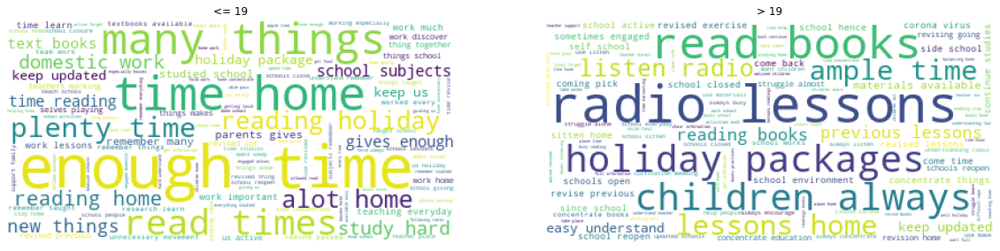

In [60]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
plt.savefig('data/imgs/clouds/schoolwork_more_age.jpeg',bbox_inches='tight', dpi=300)
plt.show()

### 3.9. When schools reopen, would you still listen to radio lessons? Why or why not?

In [14]:
lista = [radio_school_pos, radio_school_neg]
title = ['Why?','Why not?']

In [15]:
plt.rcParams['figure.figsize'] = [20 , 35]

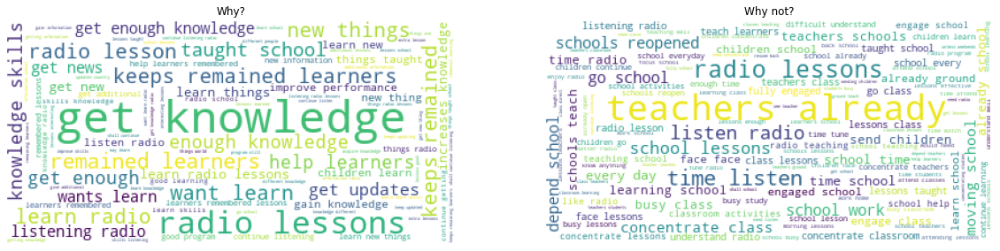

In [17]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
plt.savefig('data/imgs/clouds/radio_school_reopen.jpeg',bbox_inches='tight', dpi=300)    
plt.show()

In [233]:
radio_school_pos.shape, radio_school_neg.shape

((697, 1597), (678, 683))

#### No More Listen VS Gender

In [23]:
lista = [radio_school_neg[data.loc[radio_school_neg.index, 'Gender '] == 'Male'],
         radio_school_neg[data.loc[radio_school_neg.index, 'Gender '] == 'Female']]
title = ['Male','Female']

In [24]:
plt.rcParams['figure.figsize'] = [20 , 35]

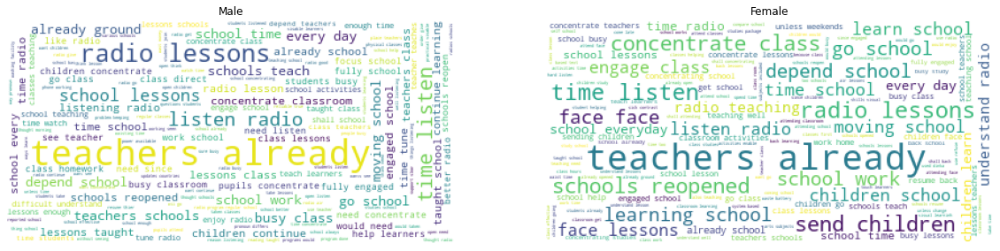

In [25]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
plt.savefig('data/imgs/clouds/radio_school_reopen_gender.jpeg',bbox_inches='tight', dpi=300)    
plt.show()

#### No More Listen VS Title

In [237]:
data.Title.value_counts()

Learner                    2510
Parent/guardian/sibling    1185
Teacher                     228
Name: Title, dtype: int64

In [238]:
radio_school_neg[data.loc[radio_school_neg.index, 'Title'] == 'Parent/guardian/sibling'].shape

(160, 683)

In [239]:
radio_school_neg[data.loc[radio_school_neg.index, 'Title'] == 'Learner'].shape

(448, 683)

In [240]:
radio_school_neg[data.loc[radio_school_neg.index, 'Title'] == 'Teacher'].shape

(70, 683)

In [20]:
lista = [radio_school_neg[data.loc[radio_school_neg.index, 'Title'] == 'Learner'], 
         radio_school_neg[data.loc[radio_school_neg.index, 'Title'] == 'Teacher']]
title = ['Learner','Teacher']

In [21]:
plt.rcParams['figure.figsize'] = [20 , 35]

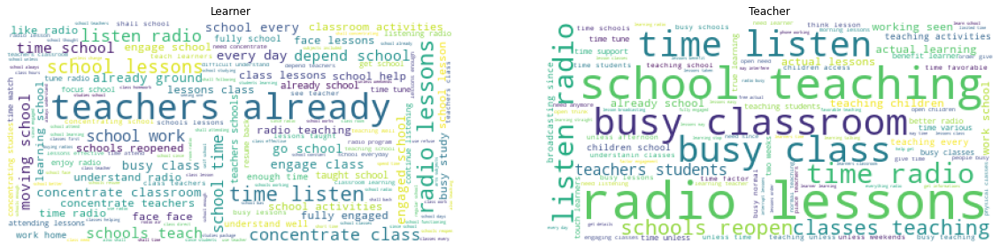

In [22]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
plt.savefig('data/imgs/clouds/radio_school_title.jpeg',bbox_inches='tight', dpi=300)    
plt.show()

#### No More Listen VS School Level

In [244]:
data.loc[:,'School Type Level'].value_counts()

Primary      3271
Secondary     612
ALP            34
ECD             4
AES             2
Name: School Type Level, dtype: int64

In [26]:
lista = [radio_school_neg[data.loc[radio_school_neg.index, 'School Type Level'] == 'Primary'],
         radio_school_neg[data.loc[radio_school_neg.index, 'School Type Level'] == 'Secondary']]
title = ['Primary','Secondary']

In [27]:
plt.rcParams['figure.figsize'] = [20 , 35]

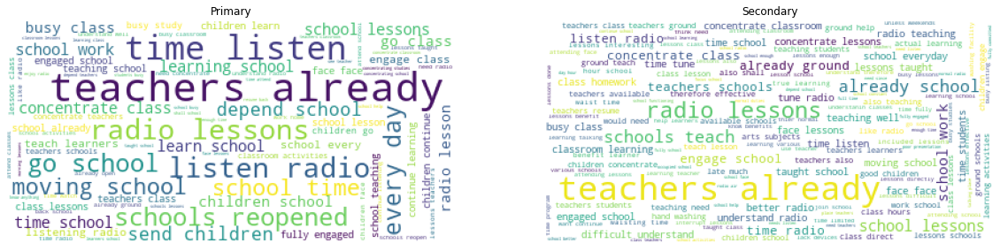

In [28]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
plt.savefig('data/imgs/clouds/radio_school_reopen_level.jpeg',bbox_inches='tight', dpi=300)    
plt.show()

#### No More Listen VS School Level

In [248]:
data.loc[:,'What is the School location'].value_counts()

Urban    2118
Rural    1805
Name: What is the School location, dtype: int64

In [29]:
lista = [radio_school_neg[data.loc[radio_school_neg.index, 'What is the School location'] == 'Urban'],
         radio_school_neg[data.loc[radio_school_neg.index, 'What is the School location'] == 'Rural']]
title = ['Urban','Rural']

In [30]:
plt.rcParams['figure.figsize'] = [20 , 35]

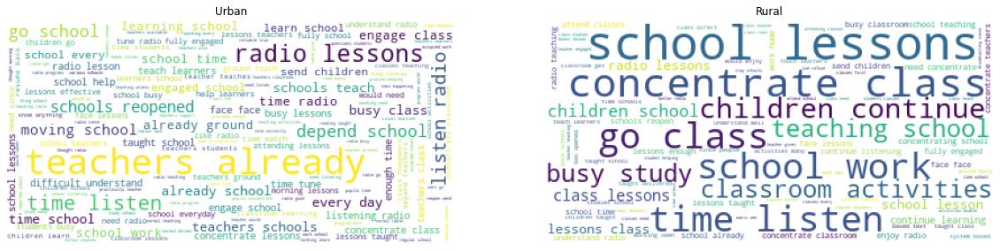

In [31]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
plt.savefig('data/imgs/clouds/radio_school_reopen:loc.jpeg',bbox_inches='tight', dpi=300)    
plt.show()

#### No More Listen VS Age

In [252]:
data.loc[radio_school_neg.index, 'Age'].value_counts()

15.0    52
14.0    52
18.0    51
16.0    50
17.0    46
20.0    34
13.0    32
19.0    31
22.0    22
21.0    19
12.0    17
23.0    16
30.0    16
40.0    14
28.0    14
34.0    13
32.0    12
39.0    11
25.0    10
36.0    10
45.0    10
33.0     9
26.0     9
35.0     8
48.0     7
37.0     7
43.0     6
29.0     6
52.0     6
24.0     6
38.0     6
27.0     6
42.0     6
11.0     5
31.0     5
41.0     5
10.0     5
46.0     4
53.0     4
9.0      4
50.0     3
60.0     3
49.0     3
56.0     3
51.0     2
44.0     2
68.0     2
59.0     2
55.0     2
58.0     2
70.0     1
5.0      1
7.0      1
57.0     1
61.0     1
8.0      1
64.0     1
65.0     1
Name: Age, dtype: int64

In [32]:
lista = [radio_school_neg[data.loc[radio_school_neg.index, 'Age'] <= 19],
         radio_school_neg[data.loc[radio_school_neg.index, 'Age'] > 19]]
title = ['<= 19','> 19']

In [33]:
plt.rcParams['figure.figsize'] = [20 , 35]

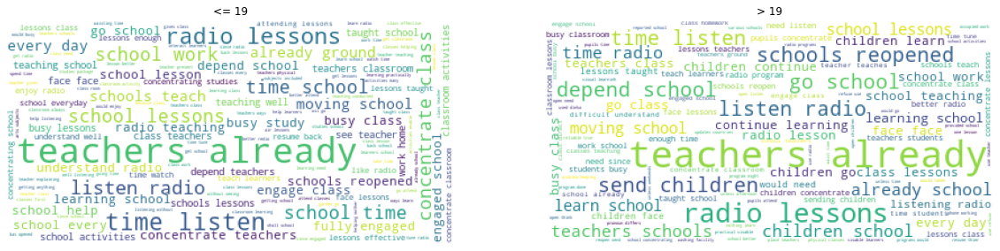

In [34]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
plt.savefig('data/imgs/clouds/radio_school_reopen_age.jpeg',bbox_inches='tight', dpi=300)    

plt.show()

### 3.10. What materials are you using? How often do you use these materials? Do you find these materials more or less helpful than radio lessons? Why?

In [256]:
lista = [learning_mat_less, learning_mat_more]
title = ['Learning materials less helpful','Learning materials more helpful']

In [257]:
plt.rcParams['figure.figsize'] = [20 , 35]

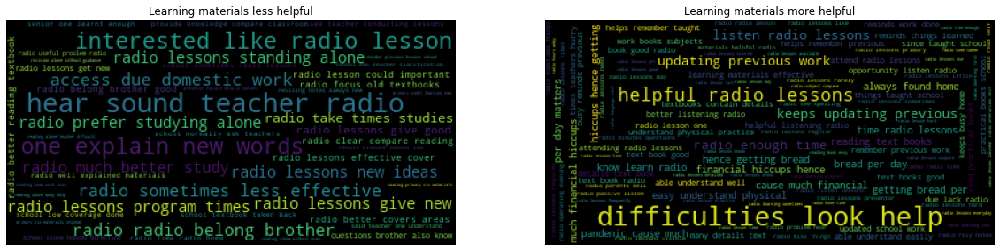

In [258]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='black')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
    
plt.show()

In [259]:
learning_mat_less.shape, learning_mat_more.shape

((600, 358), (805, 906))

#### More Useful than Radio VS Gender

In [260]:
lista = [learning_mat_more[data.loc[learning_mat_more.index, 'Gender '] == 'Male'],
         learning_mat_more[data.loc[learning_mat_more.index, 'Gender '] == 'Female']]
title = ['Male','Female']

In [261]:
plt.rcParams['figure.figsize'] = [20 , 35]

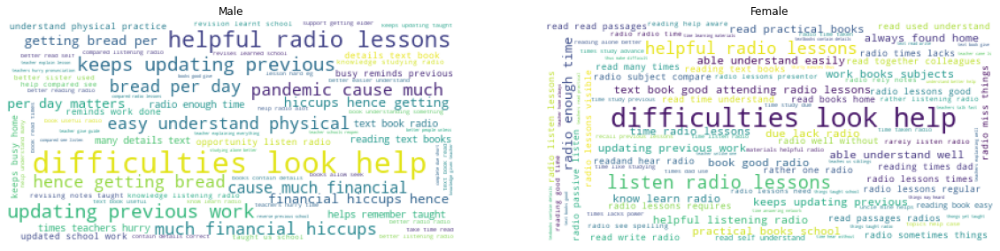

In [262]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
    
plt.show()

#### More Useful than Radio VS Title

In [263]:
data.Title.value_counts()

Learner                    2510
Parent/guardian/sibling    1185
Teacher                     228
Name: Title, dtype: int64

In [264]:
learning_mat_more[data.loc[learning_mat_more.index, 'Title'] == 'Parent/guardian/sibling'].shape

(0, 906)

In [265]:
learning_mat_more[data.loc[learning_mat_more.index, 'Title'] == 'Learner'].shape

(805, 906)

In [266]:
learning_mat_more[data.loc[learning_mat_more.index, 'Title'] == 'Teacher'].shape

(0, 906)

Only learners

#### More Useful than Radio VS School Level

In [267]:
data.loc[:,'School Type Level'].value_counts()

Primary      3271
Secondary     612
ALP            34
ECD             4
AES             2
Name: School Type Level, dtype: int64

In [268]:
lista = [learning_mat_more[data.loc[learning_mat_more.index, 'School Type Level'] == 'Primary'],
         learning_mat_more[data.loc[learning_mat_more.index, 'School Type Level'] == 'Secondary']]
title = ['Primary','Secondary']

In [269]:
plt.rcParams['figure.figsize'] = [20 , 35]

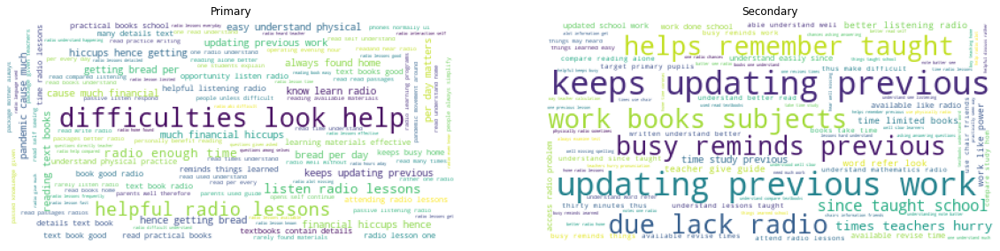

In [270]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
    
plt.show()

#### More Useful than Radio VS School Level

In [271]:
data.loc[:,'What is the School location'].value_counts()

Urban    2118
Rural    1805
Name: What is the School location, dtype: int64

In [272]:
lista = [learning_mat_more[data.loc[learning_mat_more.index, 'What is the School location'] == 'Urban'],
         learning_mat_more[data.loc[learning_mat_more.index, 'What is the School location'] == 'Rural']]
title = ['Urban','Rural']

In [273]:
plt.rcParams['figure.figsize'] = [20 , 35]

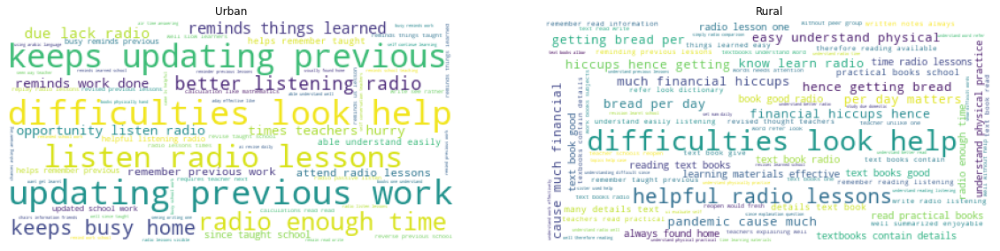

In [274]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
    
plt.show()

#### More Useful than Radio VS Age

In [275]:
data.loc[learning_mat_more.index, 'Age'].value_counts()

17.0    101
15.0    100
16.0     94
14.0     91
18.0     82
20.0     59
19.0     55
13.0     53
12.0     42
21.0     26
10.0     20
22.0     16
11.0     13
23.0     12
9.0      10
24.0      8
26.0      6
8.0       4
27.0      3
25.0      2
7.0       2
46.0      1
51.0      1
30.0      1
31.0      1
45.0      1
29.0      1
Name: Age, dtype: int64

In [276]:
lista = [learning_mat_more[data.loc[learning_mat_more.index, 'Age'] <= 19],
         learning_mat_more[data.loc[learning_mat_more.index, 'Age'] > 19]]
title = ['<= 19','> 19']

In [277]:
plt.rcParams['figure.figsize'] = [20 , 35]

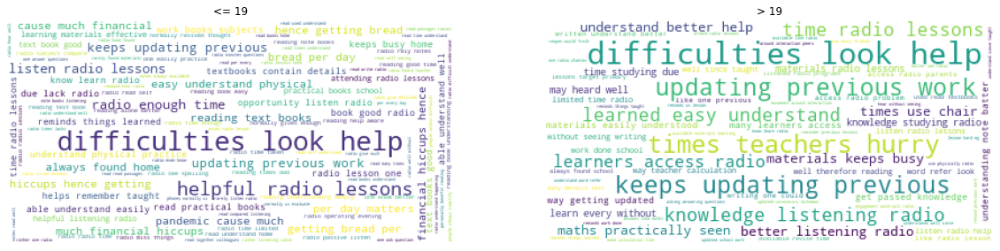

In [278]:
for i, tokens in enumerate(lista):
    cloud = WordCloud(background_color='white')
    cloud.generate_from_frequencies(tokens.sum().sort_values())
    plt.subplot(1, 2, i + 1)
    plt.title(title[i])
    plt.imshow(cloud)
    plt.axis('off')
    
plt.show()